## Practical Work 4

For this practical work, the student will have to develop a Python program that is able to implement the accelerated gradient descent methods with adaptive learning rate <b>(Adagrad, RMSProp, and Adam)</b> in order to achieve the linear regression of a set of datapoints.
##### Please notice that we will apply these algorithm to single variable LR.

#### Import numpy, matplotlib.pyplot and make it inline

In [40]:
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline

To have a dataset or set of data points, the student must generate a pair of arrays <b>X</b> and <b>y</b> with the values in <b>X</b> equally distributed between <b>0</b> and <b>20</b> and the values in <b>y</b> such that: 
<b>yi = a*xi + b (and a = -1, b = 2)</b>


In [41]:
X = np.linspace(0,20)
X

array([ 0.        ,  0.40816327,  0.81632653,  1.2244898 ,  1.63265306,
        2.04081633,  2.44897959,  2.85714286,  3.26530612,  3.67346939,
        4.08163265,  4.48979592,  4.89795918,  5.30612245,  5.71428571,
        6.12244898,  6.53061224,  6.93877551,  7.34693878,  7.75510204,
        8.16326531,  8.57142857,  8.97959184,  9.3877551 ,  9.79591837,
       10.20408163, 10.6122449 , 11.02040816, 11.42857143, 11.83673469,
       12.24489796, 12.65306122, 13.06122449, 13.46938776, 13.87755102,
       14.28571429, 14.69387755, 15.10204082, 15.51020408, 15.91836735,
       16.32653061, 16.73469388, 17.14285714, 17.55102041, 17.95918367,
       18.36734694, 18.7755102 , 19.18367347, 19.59183673, 20.        ])

In [42]:
a=-1
b=2
y=a*X+b
y

array([  2.        ,   1.59183673,   1.18367347,   0.7755102 ,
         0.36734694,  -0.04081633,  -0.44897959,  -0.85714286,
        -1.26530612,  -1.67346939,  -2.08163265,  -2.48979592,
        -2.89795918,  -3.30612245,  -3.71428571,  -4.12244898,
        -4.53061224,  -4.93877551,  -5.34693878,  -5.75510204,
        -6.16326531,  -6.57142857,  -6.97959184,  -7.3877551 ,
        -7.79591837,  -8.20408163,  -8.6122449 ,  -9.02040816,
        -9.42857143,  -9.83673469, -10.24489796, -10.65306122,
       -11.06122449, -11.46938776, -11.87755102, -12.28571429,
       -12.69387755, -13.10204082, -13.51020408, -13.91836735,
       -14.32653061, -14.73469388, -15.14285714, -15.55102041,
       -15.95918367, -16.36734694, -16.7755102 , -17.18367347,
       -17.59183673, -18.        ])

#### Plot X vs. y

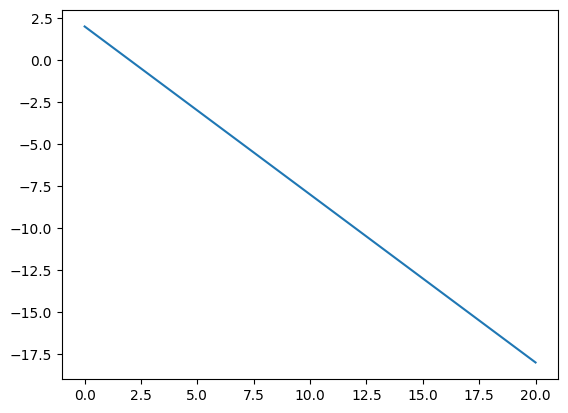

In [43]:
plt.plot(X, y)

## Adagrad

### For a single variable linear regression ML model, build a function to find the optimum Theta_0 and Theta_1 parameters using Adagrad optimization algorithm.
#### The funtion should have the following input parameters:
##### 1. Input data as a matrix (or vector based on your data).
##### 2. Target label as a vector.
##### 3. Learning rate.
##### 4. Epsilon.
##### 5. Maximum number of iterations (Epochs).
#### The funtion should return the following outputs:
##### 1. All predicted Theta_0 in all iterations.
##### 2. All predicted Theta_1 in all iterations.
##### 3. Corresponding loss for each Theta_0 and Theta_1 predictions.
##### 4.All hypothesis outputs (prdicted labels) for each Theta_0 and Theta_1 predictions.
##### 5.Final Optimum values of Theta_0 and Theta_1.
#### Choose the suitable number of iterations, learning rate, Epsilon, and stop criteria.
#### Calculate r2 score. Shouldn't below 0.9
#### Plot the required curves (loss-epochs, loss-theta0, loss-theta1, all fitted lines per epoch (single graph), best fit line)
#### Try different values of the huperparameters and see the differnce in your results.

In [44]:
def ADA_GD(X , y , alpha , iterations , epsilon):
    accum_GD=0
    m = len(y)
    lr = alpha
    x_b = np.c_[np.ones((len(X),1)) , X]
    theta = np.zeros((x_b.shape[1] , 1))
    y = y.reshape(-1,1)
    total_cost = []
    y_predictions = []
    theta_history0 = []
    theta_history1 = []
    for i in range(iterations):
        y_pred = x_b.dot(theta)
        assert y_pred.shape == y.shape , "shape of y_pred and y are not the same"
        y_predictions.append(y_pred)

        error = y_pred - y
        cost = (1/(2*m)) * np.sum(error**2)
        gradients = (1/m) * x_b.T.dot(error)
        
        if np.linalg.norm(gradients) < 1e-2:
            print(f"converged at epoch {i+1}")
            break
        
        accum_GD = accum_GD + gradients**2
        theta = theta - (lr/np.sqrt(accum_GD+epsilon))*gradients
        total_cost.append(cost)
        theta_history0.append(theta[0][0])
        theta_history1.append(theta[1][0])
        
        print(f"epoch {i+1}\nCost:{cost}\nTheta0: {theta[0][0]} \nTheta1: {theta[1][0]}\nGradient:{gradients}\nGradient Norm: {np.linalg.norm(gradients)}\n")

    return theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions

In [45]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = ADA_GD(X, y, alpha=0.05, epsilon=1e-08, iterations=500)

epoch 1
Cost:49.34693877551021
Theta0: -0.04999999999609375 
Theta1: -0.049999999999981
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:43.40686224492911
Theta0: -0.08407515041601737 
Theta1: -0.08418582469570034
Gradient:[[  7.45      ]
 [107.45918367]]
Gradient Norm: 107.71712331740687

epoch 3
Cost:39.570357376447134
Theta0: -0.11123934045069855 
Theta1: -0.11150148503377526
Gradient:[[  7.0740666 ]
 [102.51381088]]
Gradient Norm: 102.75759748169925

epoch 4
Cost:36.63600327518324
Theta0: -0.1343146358783776 
Theta1: -0.13475214038431185
Gradient:[[ 6.77374581]
 [98.56291677]]
Gradient Norm: 98.79540574038813

epoch 5
Cost:34.23008335519188
Theta0: -0.15460813674850699 
Theta1: -0.1552380978675456
Gradient:[[ 6.51816396]
 [95.2004429 ]]
Gradient Norm: 95.42332413475525

epoch 6
Cost:32.18016178445697
Theta0: -0.1728501428066252 
Theta1: -0.17368619080907943
Gradient:[[ 6.29301088]
 [92.23817484]]
Gradient Norm: 92.45259803520558

epoch 7
Cos

In [46]:
from sklearn.metrics import r2_score
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.9568765565566426

In [47]:
class plotting:
    def __init__(self, total_cost, num, theta_history0, theta_history1, X, y, y_predictions, theta):
        self.total_cost = total_cost
        self.num = num
        self.theta_history0 = theta_history0
        self.theta_history1 = theta_history1
        self.X = X
        self.y = y
        self.y_predictions = y_predictions
        self.theta = theta

    def plot_loss_epochs(self):
        plt.plot(self.total_cost[:self.num],"-o")
        plt.xlabel("epochs")
        plt.ylabel("losses")
        plt.show()

    def plot_loss_theta0(self):
        plt.plot(self.theta_history0, self.total_cost, "-o")
        plt.xlabel("theta_history0")
        plt.ylabel("losses")
        plt.title("lr=0.05")
        plt.show()

    def plot_loss_theta1(self):
        plt.plot(self.theta_history1, self.total_cost, "-o")
        plt.xlabel("theta_history1")
        plt.ylabel("losses")
        plt.title("lr=0.05")
        plt.show()
        
    def plot_all_lines(self):
        plt.scatter(self.X,self.y)
        for i in self.y_predictions:
            plt.plot(self.X, i, color="red", alpha=0.1)
        plt.xlabel("X")
        plt.ylabel("y")
        plt.show()

    def plot_best_line(self):
        plt.scatter(self.X,self.y,color="blue")
        plt.plot(self.X, self.theta[0][0] + self.theta[1][0]*self.X, color="red")
        plt.xlabel("X")
        plt.ylabel("y")
        plt.show()
        
    def plot_all_plots(self):
        self.plot_loss_epochs()
        self.plot_loss_theta0()
        self.plot_loss_theta1()
        self.plot_all_lines()
        self.plot_best_line()



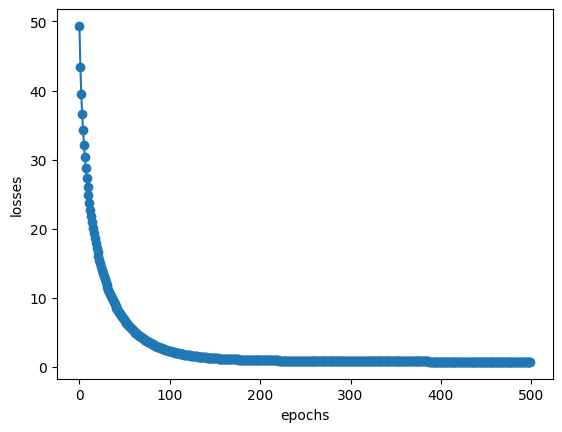

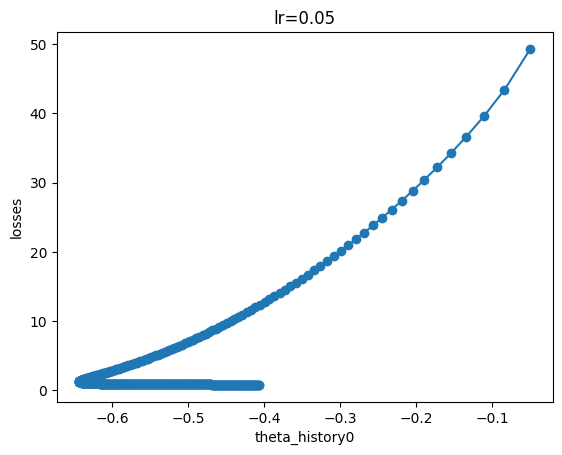

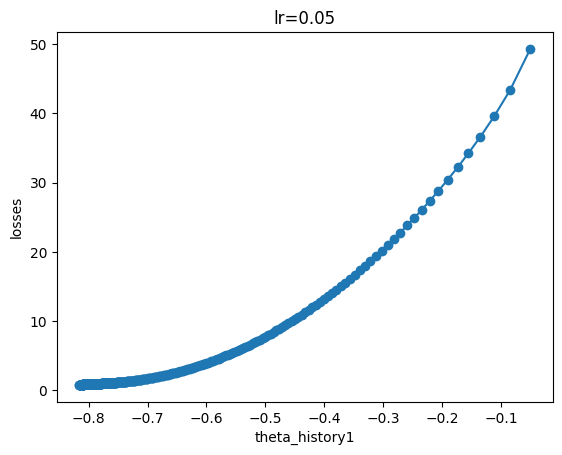

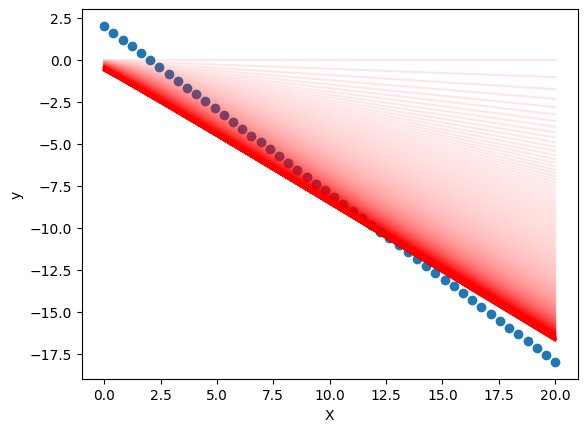

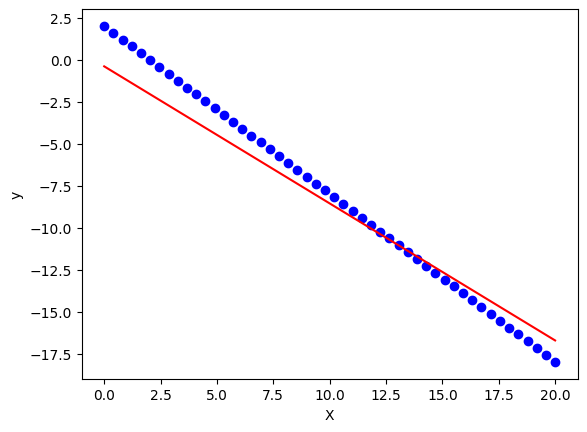

In [48]:
plots = plotting(total_cost, 500, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

##### The following results uses alpha = 0.05, epsilon =  1e-08, and max. iterations = 500.

##### The following results uses alpha = 0.005, epsilon =  1e-08, and max. iterations = 5000.

In [49]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = ADA_GD(X, y, alpha=0.005, epsilon=1e-08, iterations=5000)

epoch 1
Cost:49.34693877551021
Theta0: -0.004999999999609375 
Theta1: -0.0049999999999981
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:48.73541556122782
Theta0: -0.008523317625923729 
Theta1: -0.008524330214489145
Gradient:[[  7.945     ]
 [113.97040816]]
Gradient Norm: 114.24699979387754

epoch 3
Cost:48.306720339695175
Theta0: -0.011393994663177054 
Theta1: -0.01139634341790073
Gradient:[[  7.90623338]
 [113.46046928]]
Gradient Norm: 113.73559960080583

epoch 4
Cost:47.95880620636534
Theta0: -0.013876039837410552 
Theta1: -0.01387988471708459
Gradient:[[  7.87464257]
 [113.04491992]]
Gradient Norm: 113.31885948612488

epoch 5
Cost:47.65898937777611
Theta0: -0.016093038751812942 
Theta1: -0.016098476049455104
Gradient:[[  7.84732511]
 [112.68558166]]
Gradient Norm: 112.95849160427606

epoch 6
Cost:47.39197174701949
Theta0: -0.01811447196646 
Theta1: -0.018121566670951612
Gradient:[[  7.8229222]
 [112.364581 ]]
Gradient Norm: 112.63657121670

In [50]:
r2 = r2_score(y, theta[0][0]+theta[1][0]*X)
r2

0.7096780137845113

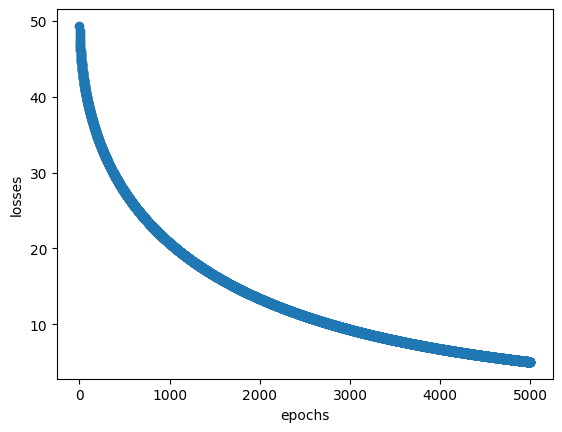

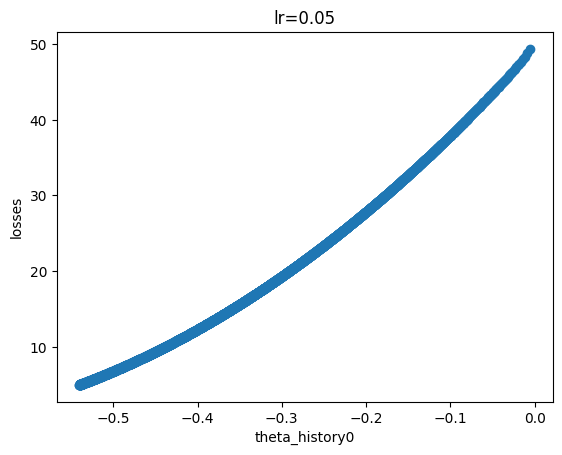

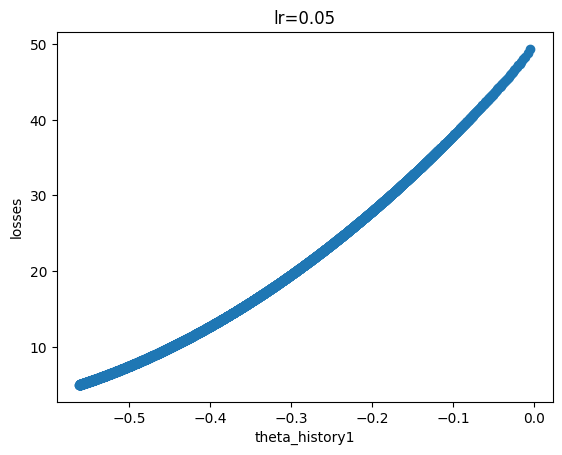

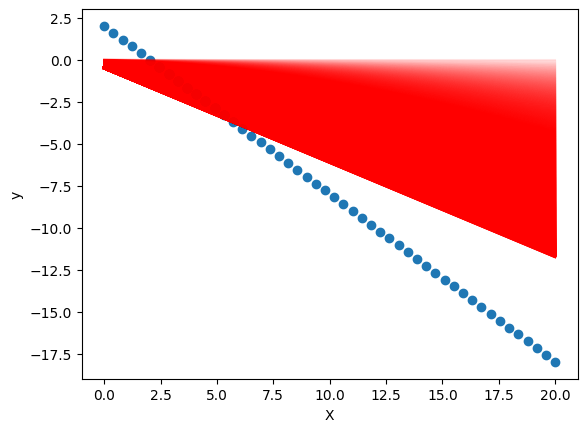

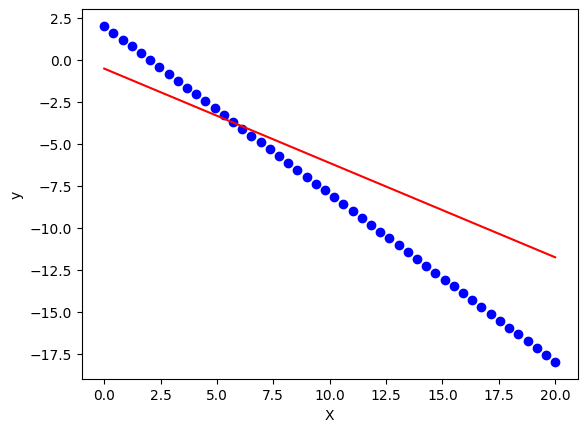

In [51]:
plots = plotting(total_cost, 5000, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

In [52]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = ADA_GD(X, y, alpha=0.0005, epsilon=1e-08, iterations=5000)

epoch 1
Cost:49.34693877551021
Theta0: -0.0004999999999609375 
Theta1: -0.00049999999999981
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:49.285611298469725
Theta0: -0.0008534317938748784 
Theta1: -0.0008534418301037835
Gradient:[[  7.9945    ]
 [114.62153061]]
Gradient Norm: 114.89998829479441

epoch 3
Cost:49.2422834691327
Theta0: -0.001141947114014395 
Theta1: -0.0011419703445437674
Gradient:[[  7.99061215]
 [114.57038984]]
Gradient Norm: 114.84870095683434

epoch 4
Cost:49.2069277113446
Theta0: -0.0013917688158285478 
Theta1: -0.001391806770261835
Gradient:[[  7.98743835]
 [114.52864167]]
Gradient Norm: 114.80683312971341

epoch 5
Cost:49.176323708455215
Theta0: -0.0016151864697693894 
Theta1: -0.0016152400471216388
Gradient:[[  7.98469016]
 [114.49249201]]
Gradient Norm: 114.77057987204074

epoch 6
Cost:49.1489622413152
Theta0: -0.0018191143569669106 
Theta1: -0.001819184148048848
Gradient:[[  7.98223241]
 [114.46016274]]
Gradient Norm: 

In [53]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

-1.3787035046450105

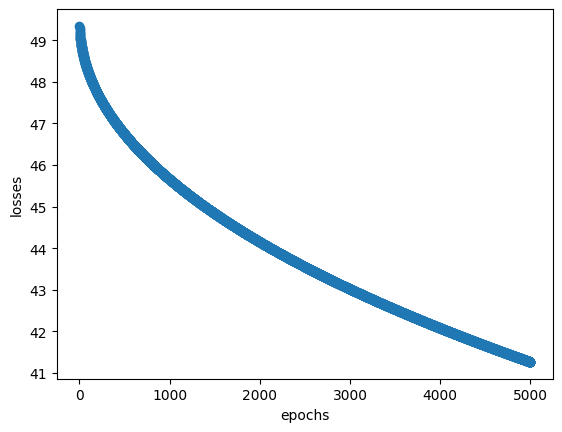

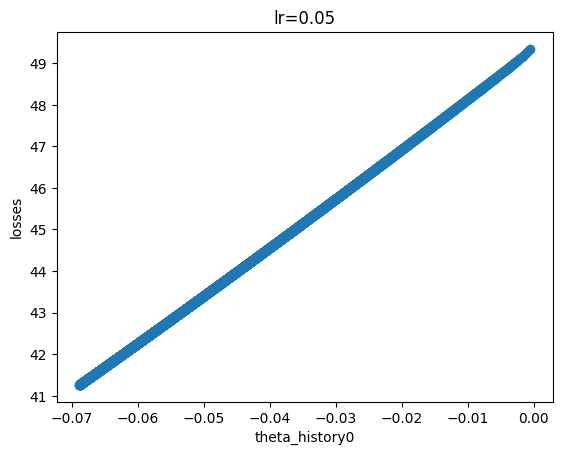

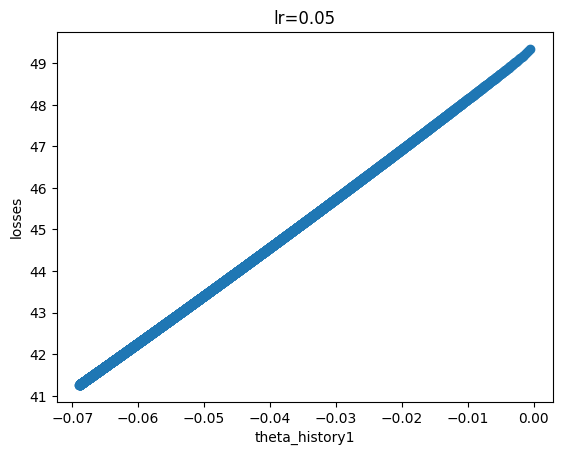

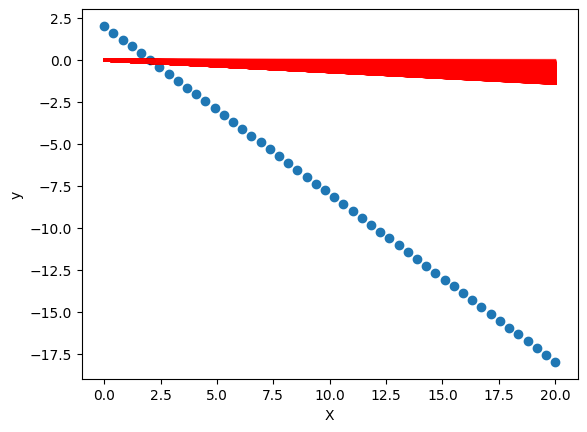

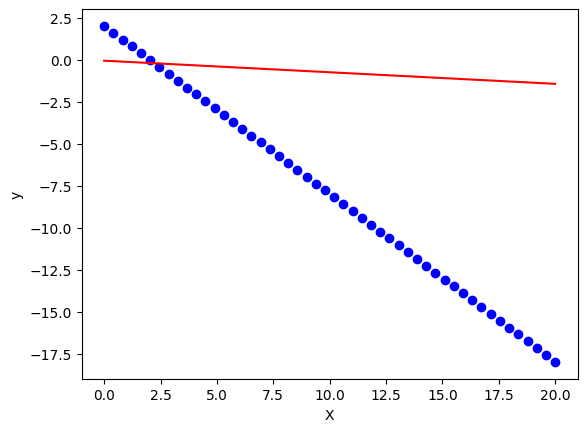

In [54]:
plots = plotting(total_cost, 5000, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

## RMSProp

### Update the previos implementation to be RMSProp.
#### Compare your results with Adagrad results.

In [56]:
def RMS_Prob(X , y , alpha , iterations , epsilon, Beta):
    Moving_Average_Accumulator=0
    m = len(y)
    lr = alpha
    x_b = np.c_[np.ones((len(X),1)) , X]
    theta = np.zeros((x_b.shape[1] , 1))
    y = y.reshape(-1,1)
    total_cost = []
    y_predictions = []
    theta_history0 = []
    theta_history1 = []
    for i in range(iterations):
        y_pred = x_b.dot(theta)
        assert y_pred.shape == y.shape , "shape of y_pred and y are not the same"
        y_predictions.append(y_pred)

        error = y_pred - y
        cost = (1/(2*m)) * np.sum(error**2)
        gradients = (1/m) * x_b.T.dot(error)
        
        if np.linalg.norm(gradients) < 1e-2:
            print(f"converged at epoch {i+1}")
            break
        
        Moving_Average_Accumulator = Beta*Moving_Average_Accumulator + ((1-Beta)*(gradients**2))
        theta = theta - (lr/np.sqrt(Moving_Average_Accumulator+epsilon))*gradients
        total_cost.append(cost)
        theta_history0.append(theta[0][0])
        theta_history1.append(theta[1][0])
        
        print(f"epoch {i+1}\nCost:{cost}\nTheta0: {theta[0][0]} \nTheta1: {theta[1][0]}\nGradient:{gradients}\nGradient Norm: {np.linalg.norm(gradients)}\n")

    return theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions

In [57]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = RMS_Prob(X, y, alpha=0.05, iterations=500, epsilon=1e-08, Beta=0.9)

epoch 1
Cost:49.34693877551021
Theta0: -0.1581138828848925 
Theta1: -0.158113883007818
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:31.893506844775185
Theta0: -0.2587294841208264 
Theta1: -0.2600826897300429
Gradient:[[ 6.26074729]
 [91.81576673]]
Gradient Norm: 92.02897356772216

epoch 3
Cost:22.709141157721202
Theta0: -0.33500645546409835 
Theta1: -0.33844890150996126
Gradient:[[ 5.14044362]
 [77.07503675]]
Gradient Norm: 77.24626495837721

epoch 4
Cost:16.75324476890251
Theta0: -0.39665934342516823 
Theta1: -0.40281913422595994
Gradient:[[ 4.28050453]
 [65.7568181 ]]
Gradient Norm: 65.89599263648127

epoch 5
Cost:12.577198115531221
Theta0: -0.44799746652194083 
Theta1: -0.4574939684620495
Gradient:[[ 3.57514931]
 [56.47001298]]
Gradient Norm: 56.58307218721737

epoch 6
Cost:9.536877625815743
Theta0: -0.49133405152103454 
Theta1: -0.5048134403770309
Gradient:[[ 2.97706285]
 [48.59226632]]
Gradient Norm: 48.68337754379192

epoch 7
Cost:7.28

In [59]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.9971952206210168

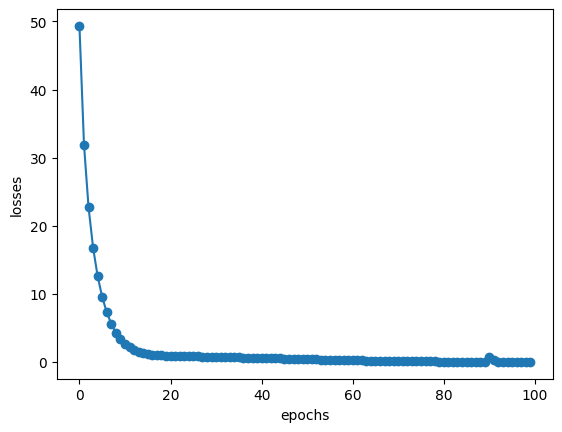

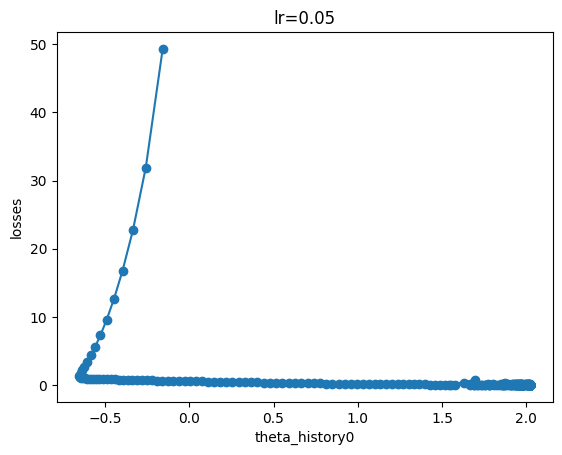

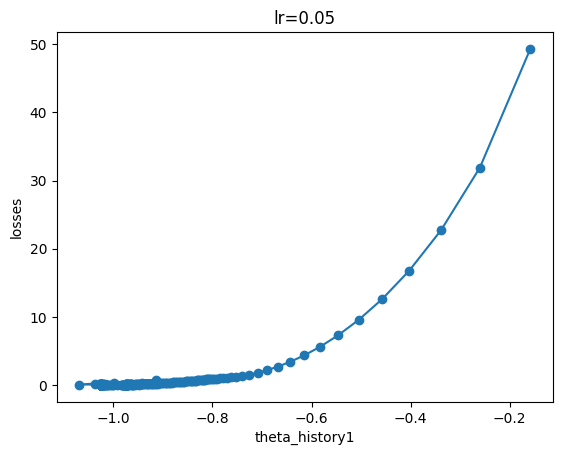

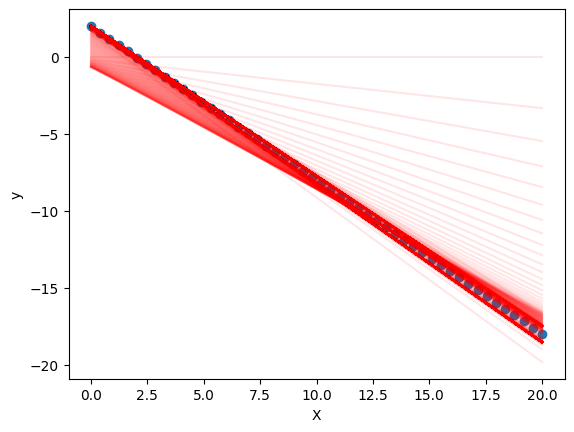

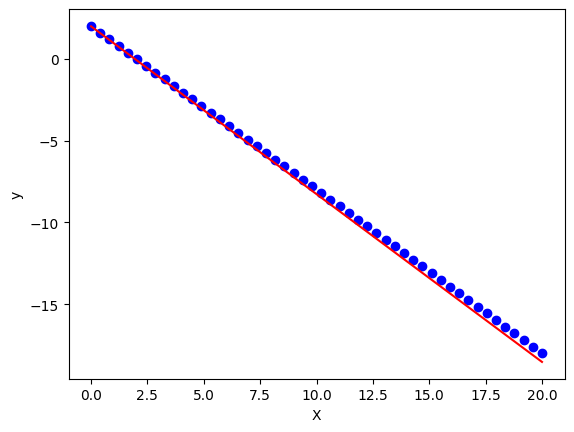

In [61]:
plots = plotting(total_cost, 100, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

##### The following results uses alpha = 0.005, beta = 0.9, epsilon =  1e-08, and max. iterations = 5000.

In [62]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = RMS_Prob(X, y, 0.005, 500, 1e-08, 0.9)

epoch 1
Cost:49.34693877551021
Theta0: -0.01581138828848925 
Theta1: -0.015811388300781798
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:47.42643997021238
Theta0: -0.02716199480762322 
Theta1: -0.027172066372594464
Gradient:[[  7.82607473]
 [112.40606647]]
Gradient Norm: 112.67817545809942

epoch 3
Cost:46.07064619798491
Theta0: -0.03660514538581013 
Theta1: -0.03662889363795195
Gradient:[[  7.70111734]
 [110.76234662]]
Gradient Norm: 111.02974663373503

epoch 4
Cost:44.957423560055496
Theta0: -0.04494688841071137 
Theta1: -0.04498638661369609
Gradient:[[  7.59710592]
 [109.39413838]]
Gradient Norm: 109.65761957482945

epoch 5
Cost:43.985225692581544
Theta0: -0.05256017867310274 
Theta1: -0.05261690495764438
Gradient:[[  7.50518925]
 [108.18501782]]
Gradient Norm: 108.44503651921632

epoch 6
Cost:43.10710992272141
Theta0: -0.05965246447202038 
Theta1: -0.059727605317803564
Gradient:[[  7.42127077]
 [107.08110081]]
Gradient Norm: 107.337958852

In [63]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.9923166248941783

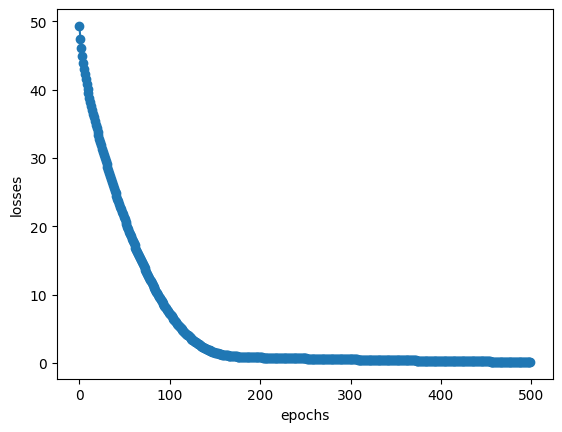

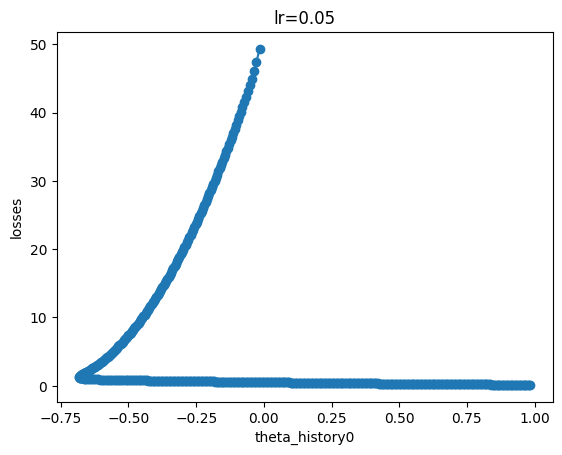

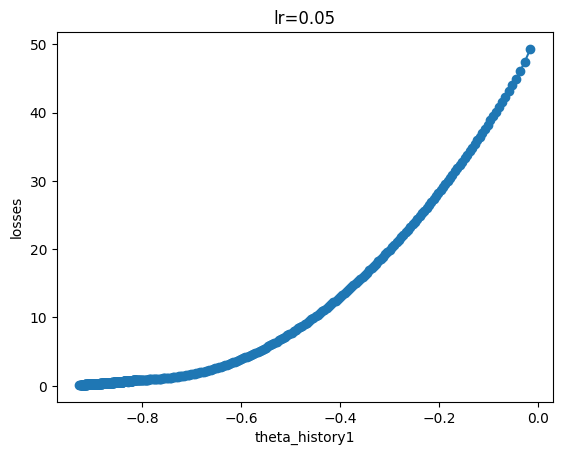

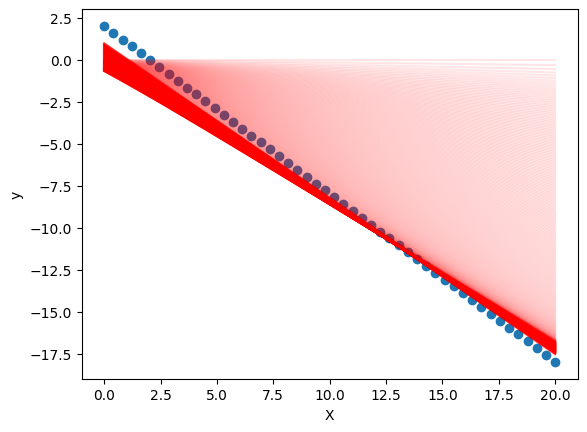

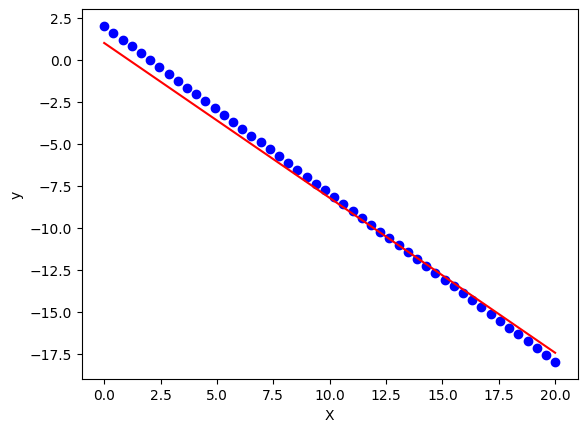

In [64]:
plots = plotting(total_cost, 600, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

##### The following results uses alpha = 0.0005, beta = 0.9, epsilon =  1e-08, and max. iterations = 5000.

In [67]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = RMS_Prob(X, y, 0.0005, 5000, 1e-08, 0.9)

epoch 1
Cost:49.34693877551021
Theta0: -0.001581138828848925 
Theta1: -0.00158113883007818
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:49.15313733885819
Theta0: -0.0027270341824692243 
Theta1: -0.0027271319586209307
Gradient:[[  7.98260747]
 [114.46509644]]
Gradient Norm: 114.7431057873055

epoch 3
Cost:49.012916127235535
Theta0: -0.0036859240624574413 
Theta1: -0.0036861528145273326
Gradient:[[  7.97000165]
 [114.29927923]]
Gradient Norm: 114.57681335675612

epoch 4
Cost:48.895729976798634
Theta0: -0.004536742574905934 
Theta1: -0.004537120200351512
Gradient:[[  7.95945255]
 [114.16051609]]
Gradient Norm: 114.4376525442444

epoch 5
Cost:48.7918674223929
Theta0: -0.005316137498362149 
Theta1: -0.005316675932282985
Gradient:[[  7.95009206]
 [114.03738781]]
Gradient Norm: 114.31417139971921

epoch 6
Cost:48.69681996844163
Theta0: -0.006044535316308554 
Theta1: -0.0060452435424655
Gradient:[[  7.9415171 ]
 [113.92459248]]
Gradient Norm: 114.20

In [68]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.9933427135979586

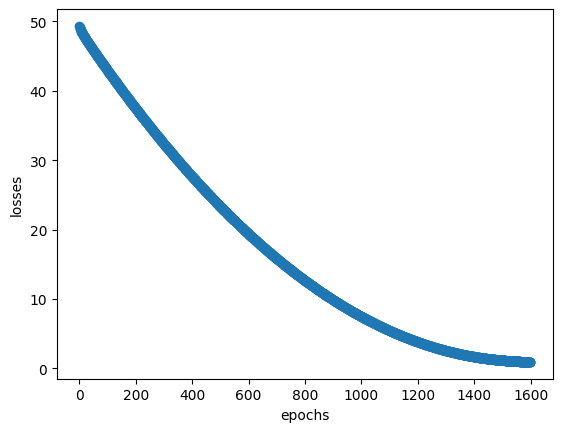

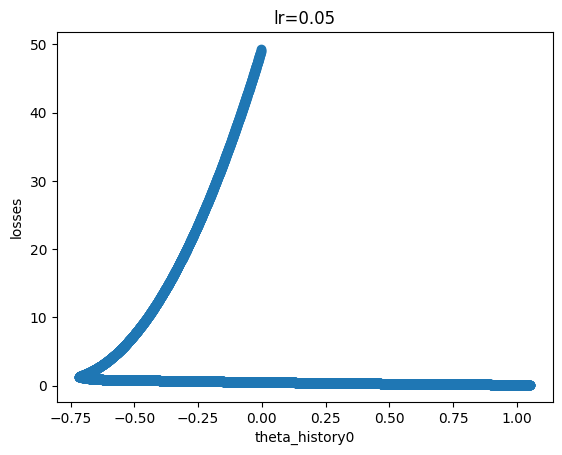

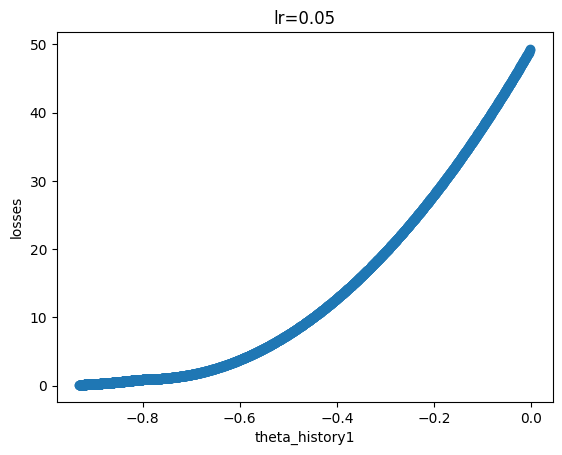

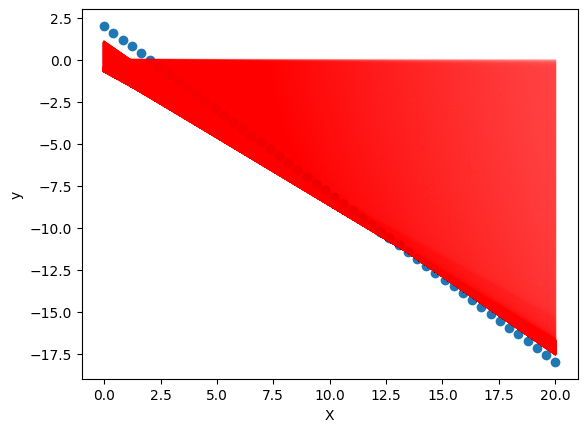

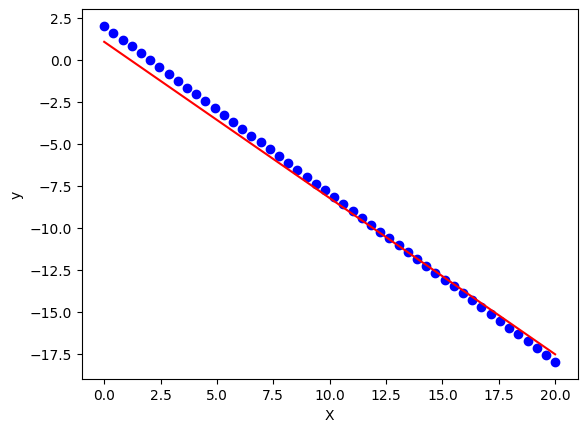

In [69]:
plots = plotting(total_cost, 1600, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

## Adam

### Update the previos implementation to be Adam.
#### Compare your results with Adagrad and RMSProp results.

In [71]:
def Adam_GD(X , y , alpha , iterations , epsilon, beta1, beta2):
    F_moment = S_moment = 0
    m = len(y)
    lr = alpha
    x_b = np.c_[np.ones((len(X),1)) , X]
    theta = np.zeros((x_b.shape[1] , 1))
    y = y.reshape(-1,1)
    total_cost = []
    y_predictions = []
    theta_history0 = []
    theta_history1 = []
    for i in range(iterations):
        y_pred = x_b.dot(theta)
        assert y_pred.shape == y.shape , "shape of y_pred and y are not the same"
        y_predictions.append(y_pred)

        error = y_pred - y
        cost = (1/(2*m)) * np.sum(error**2)
        gradients = (1/m) * x_b.T.dot(error)
        
        if np.linalg.norm(gradients) < 1e-2:
            print(f"converged at epoch {i+1}")
            break
        F_moment = (beta1*F_moment) + (1-beta1)*gradients
        S_moment = (beta2*S_moment) + ((1-beta2)*(gradients**2))
        F_updated = F_moment / (1 - beta1**(i+1))
        S_updated = S_moment / (1 - beta2**(i+1))
        nominator = lr*F_updated
        dominator = np.sqrt(S_updated)+epsilon
        theta = theta - (nominator/dominator)
        total_cost.append(cost)
        theta_history0.append(theta[0][0])
        theta_history1.append(theta[1][0])
        
        print(f"epoch {i+1}\nCost:{cost}\nTheta0: {theta[0][0]} \nTheta1: {theta[1][0]}\nGradient:{gradients}\nGradient Norm: {np.linalg.norm(gradients)}\n")

    return theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions

In [75]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = Adam_GD(X, y, 0.05, 500, 1e-08, 0.2, 0.7)

epoch 1
Cost:49.34693877551021
Theta0: -0.049999999937500005 
Theta1: -0.04999999999564057
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:43.406862245832045
Theta0: -0.09909145658549028 
Theta1: -0.09917164467399969
Gradient:[[  7.45      ]
 [107.45918367]]
Gradient Norm: 107.71712331858167

epoch 3
Cost:37.945364997955274
Theta0: -0.1469985772480954 
Theta1: -0.14727229834296998
Gradient:[[  6.9091921 ]
 [100.34514962]]
Gradient Norm: 100.58273205611421

epoch 4
Cost:32.96770817954375
Theta0: -0.19365558644121228 
Theta1: -0.1942549745762687
Gradient:[[ 6.38027844]
 [93.38721486]]
Gradient Norm: 93.60491361066894

epoch 5
Cost:28.454111077441603
Theta0: -0.23907857018940643 
Theta1: -0.24015013527485118
Gradient:[[ 5.86379467]
 [86.59236593]]
Gradient Norm: 86.7906787898514

epoch 6
Cost:24.377325340073437
Theta0: -0.2832942635678295 
Theta1: -0.2850009279471672
Gradient:[[ 5.35942008]
 [79.95633893]]
Gradient Norm: 80.1357568091784

epoch 7


In [76]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.9999999999818061

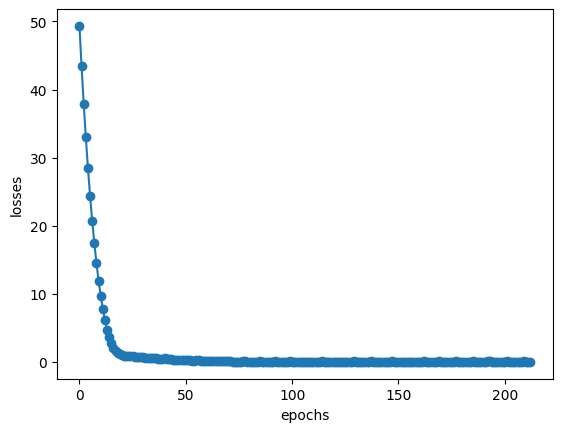

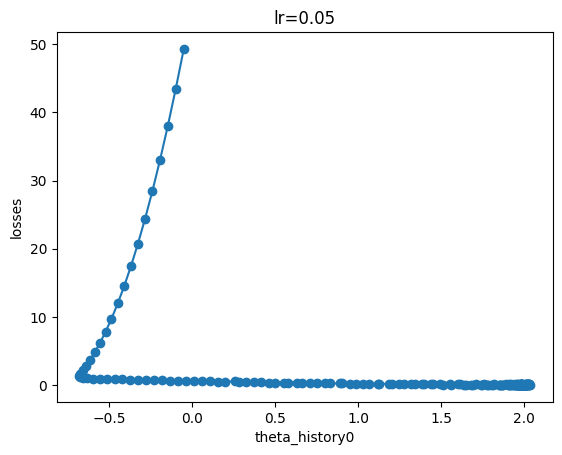

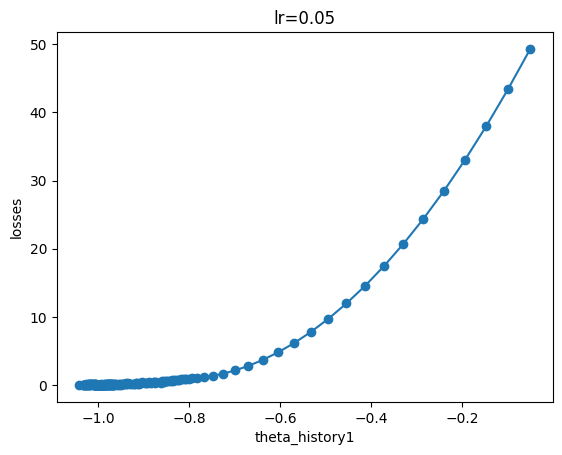

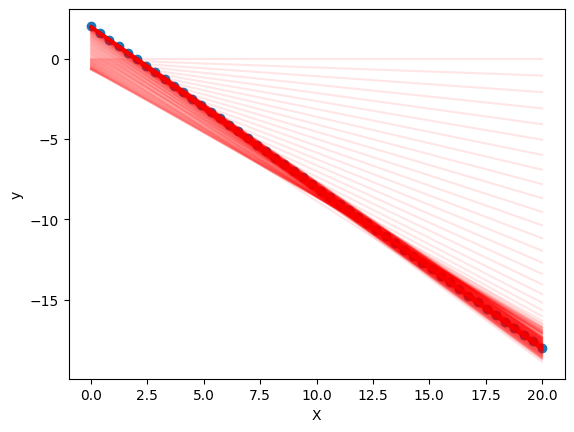

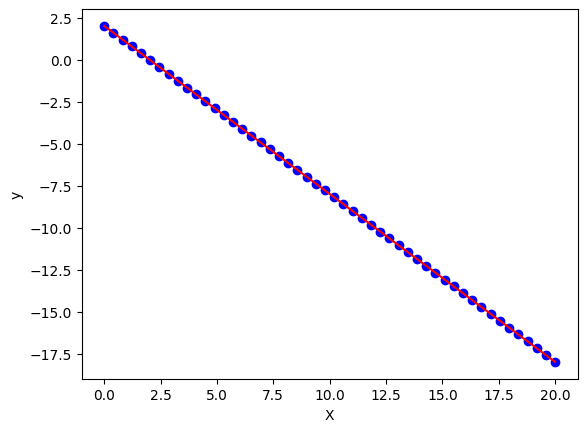

In [77]:
plots = plotting(total_cost, 600, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

##### The following results uses alpha = 0.005, beta1 = 0.5, beta2 = 0.8, epsilon =  1e-08, and max. iterations = 500.

In [78]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = Adam_GD(X, y, 0.005, 500, 1e-08, 0.2, 0.7)

epoch 1
Cost:49.34693877551021
Theta0: -0.00499999999375 
Theta1: -0.004999999999564057
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:48.73541556132383
Theta0: -0.009991511726461282 
Theta1: -0.009992216791273326
Gradient:[[  7.945     ]
 [113.97040816]]
Gradient Norm: 114.246999793995

epoch 3
Cost:48.12873309569437
Theta0: -0.014972689173013861 
Theta1: -0.014974964872253398
Gradient:[[  7.89008632]
 [113.24807201]]
Gradient Norm: 113.5225936800912

epoch 4
Cost:47.52707724264989
Theta0: -0.01994384762423163 
Theta1: -0.01994854215632031
Gradient:[[  7.83527766]
 [112.52711457]]
Gradient Norm: 112.79957043577363

epoch 5
Cost:46.930390061206836
Theta0: -0.02490613866384287 
Theta1: -0.02491401293022363
Gradient:[[  7.78057073]
 [111.80749258]]
Gradient Norm: 112.07788665914688

epoch 6
Cost:46.33852298074125
Theta0: -0.029860874551206083 
Theta1: -0.029872587650136635
Gradient:[[  7.72595373]
 [111.08905116]]
Gradient Norm: 111.357387038907

In [79]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.9929651293131617

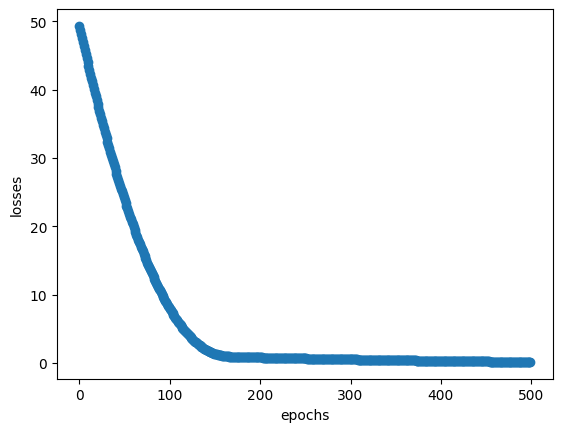

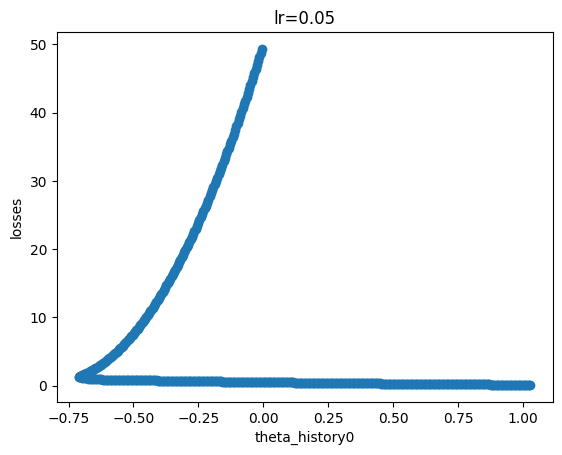

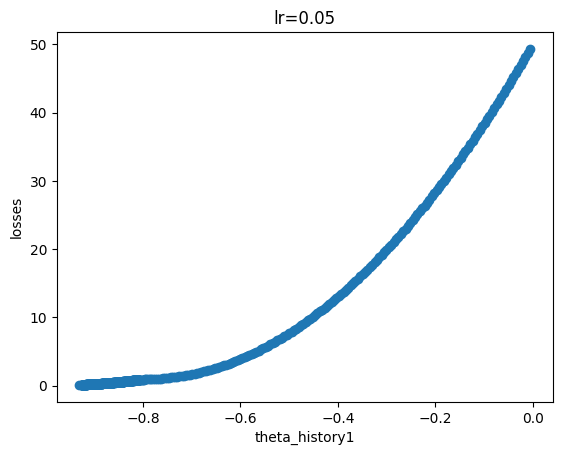

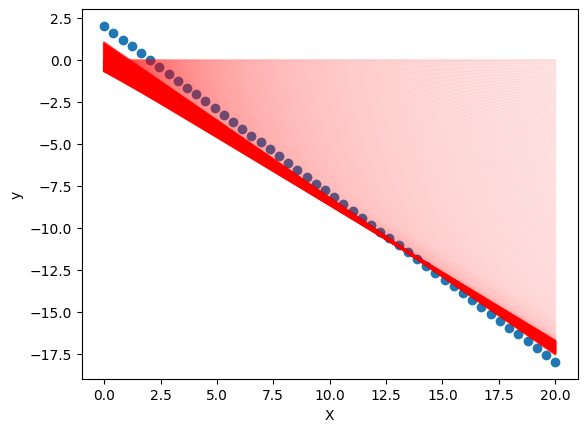

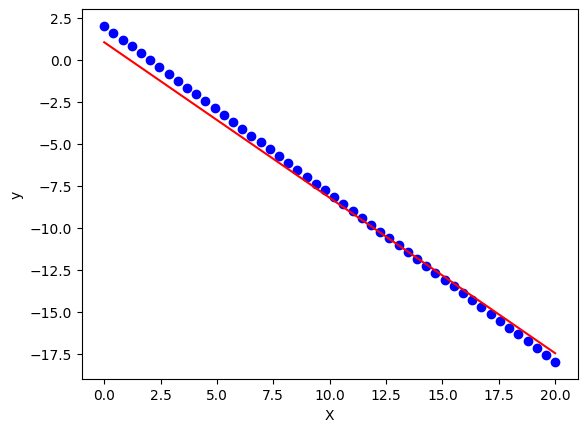

In [80]:
plots = plotting(total_cost, 600, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

In [81]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = Adam_GD(X, y, 0.0005, 5000, 1e-08, 0.2, 0.7)

epoch 1
Cost:49.34693877551021
Theta0: -0.000499999999375 
Theta1: -0.0004999999999564058
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:49.2856112984794
Theta0: -0.0009999156835730357 
Theta1: -0.0009999226452835474
Gradient:[[  7.9945    ]
 [114.62153061]]
Gradient Norm: 114.89998829480616

epoch 3
Cost:49.224332279421986
Theta0: -0.0014997293921417874 
Theta1: -0.0014997517405089423
Gradient:[[  7.98900086]
 [114.54919494]]
Gradient Norm: 114.827445304492

epoch 4
Cost:49.16310369515985
Theta0: -0.001999445044152664 
Theta1: -0.001999490889637687
Gradient:[[  7.98350275]
 [114.47687288]]
Gradient Norm: 114.75491597552434

epoch 5
Cost:49.101925080132716
Theta0: -0.0024990748251531507 
Theta1: -0.002499151280063507
Gradient:[[  7.97800565]
 [114.40456392]]
Gradient Norm: 114.68239978176858

epoch 6
Cost:49.04079503698229
Theta0: -0.0029986324353723005 
Theta1: -0.0029987454874698715
Gradient:[[  7.97250941]
 [114.33226643]]
Gradient Norm: 11

In [82]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.993266849529891

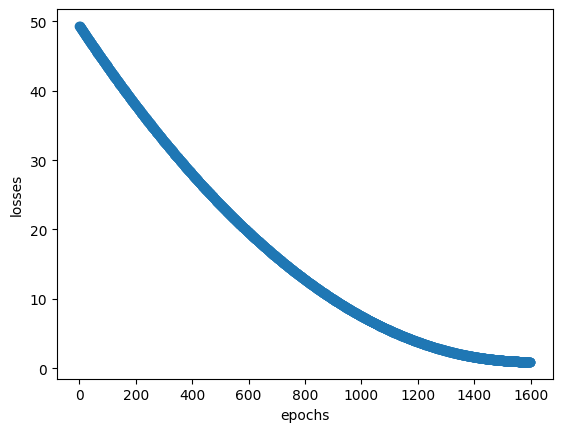

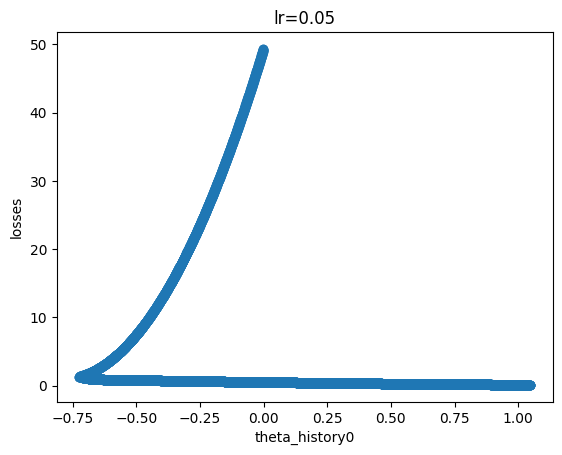

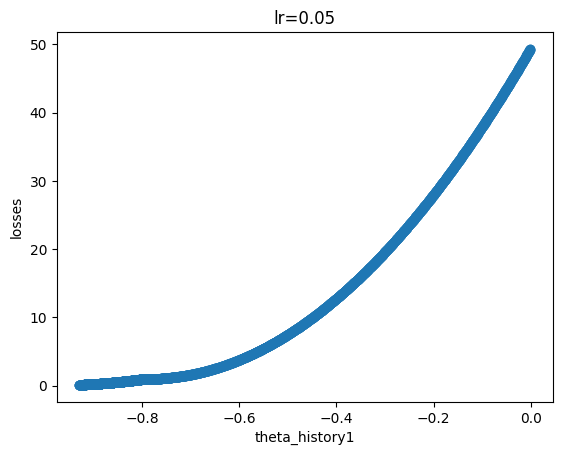

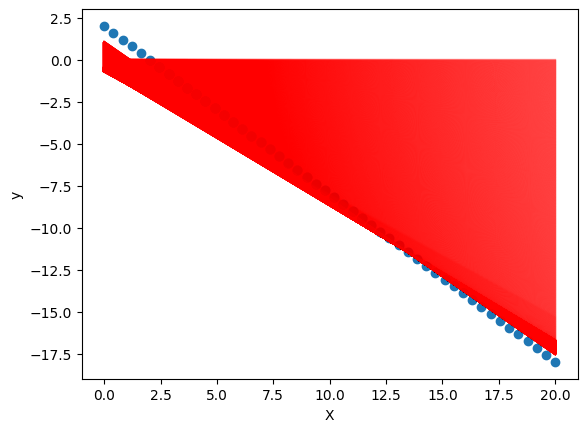

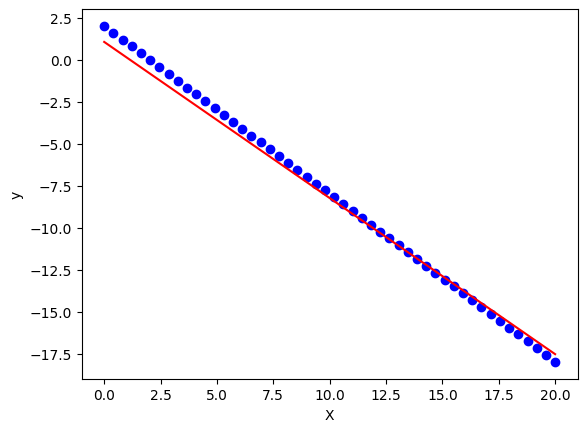

In [84]:
plots = plotting(total_cost, 1600, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

### Play with the parameters and see the results

##### The following results uses alpha = 0.001, beta1 = 0.9, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

In [85]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = Adam_GD(X, y, 0.001, 5000, 1e-08, 0.9, 0.99)

epoch 1
Cost:49.34693877551021
Theta0: -0.00099999999875 
Theta1: -0.0009999999999128115
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:49.224322744917934
Theta0: -0.001999967008791093 
Theta1: -0.001999969752253821
Gradient:[[  7.989     ]
 [114.54918367]]
Gradient Norm: 114.82743400975143

epoch 3
Cost:49.10186613184516
Theta0: -0.002999879066630612 
Theta1: -0.0029998891232695018
Gradient:[[  7.97800034]
 [114.4044942 ]]
Gradient Norm: 114.68232986172887

epoch 4
Cost:48.97957139753585
Theta0: -0.003999714297406959 
Theta1: -0.003999738064071402
Gradient:[[  7.96700123]
 [114.25981206]]
Gradient Norm: 114.53723307756536

epoch 5
Cost:48.857440980227
Theta0: -0.004999450967474331 
Theta1: -0.004999496658879161
Gradient:[[  7.95600291]
 [114.11514018]]
Gradient Norm: 114.3921465848947

epoch 6
Cost:48.73547728930088
Theta0: -0.005999067535735027 
Theta1: -0.005999145172100589
Gradient:[[  7.94500558]
 [113.97048145]]
Gradient Norm: 114.247073

In [89]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.9999889725076391

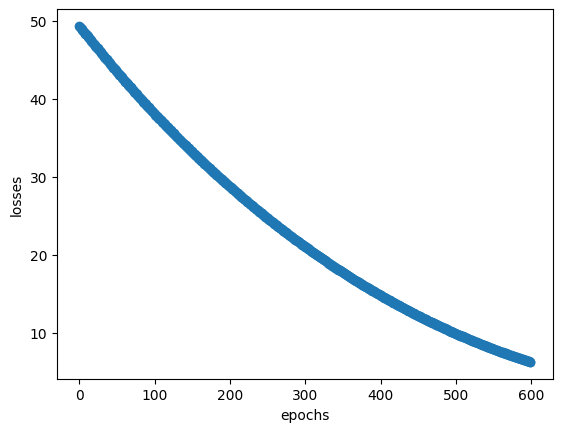

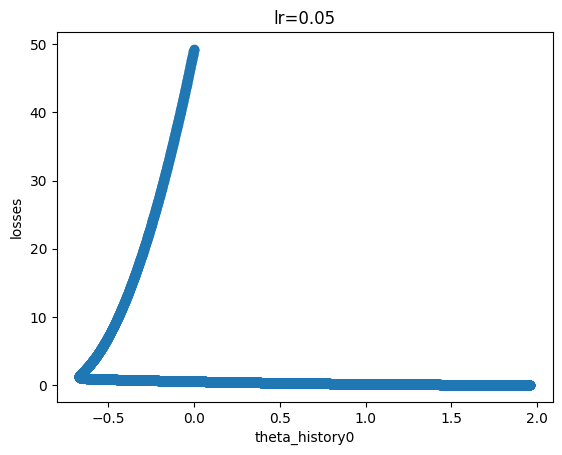

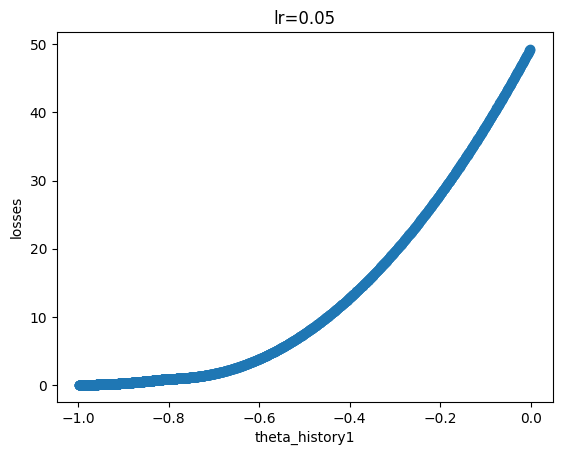

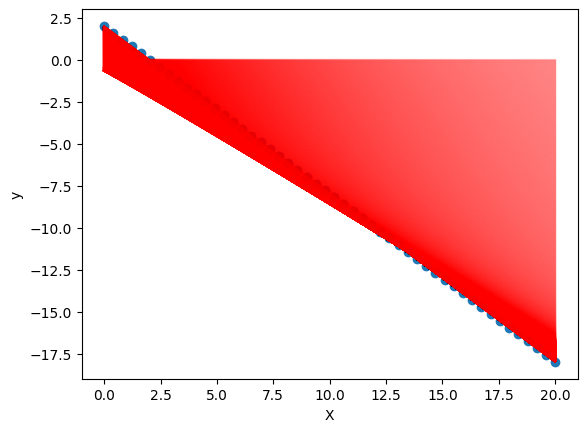

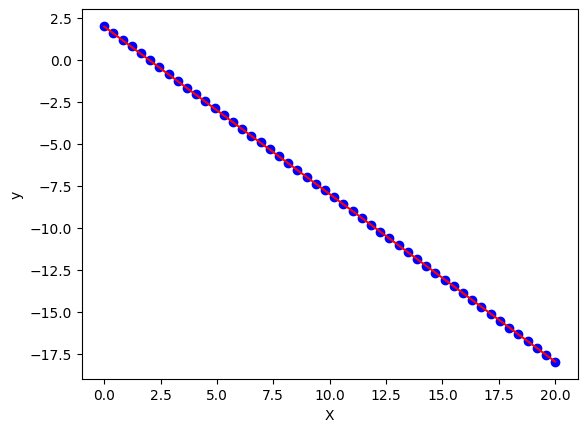

In [90]:
plots = plotting(total_cost, 600, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

##### The following results uses alpha = 0.001, beta1 = 0.9, beta2 = 0.5, epsilon =  1e-08, and max. iterations = 5000.

In [91]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = Adam_GD(X, y, 0.001, 5000, 1e-08, 0.9, 0.5)

epoch 1
Cost:49.34693877551021
Theta0: -0.00099999999875 
Theta1: -0.0009999999999128115
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:49.224322744917934
Theta0: -0.0020001929465219203 
Theta1: -0.0020001770335715385
Gradient:[[  7.989     ]
 [114.54918367]]
Gradient Norm: 114.82743400975143

epoch 3
Cost:49.10184061540296
Theta0: -0.0030006863447530332 
Theta1: -0.0030006296933462275
Gradient:[[  7.97799804]
 [114.40446402]]
Gradient Norm: 114.6822995960251

epoch 4
Cost:48.97948034859551
Theta0: -0.004001562113046433 
Theta1: -0.004001433068717058
Gradient:[[  7.96699302]
 [114.25970424]]
Gradient Norm: 114.5371249444076

epoch 5
Cost:48.85723285353418
Theta0: -0.005002875686388075 
Theta1: -0.005002637926340931
Gradient:[[  7.95598411]
 [114.11489339]]
Gradient Norm: 114.39189909019622

epoch 6
Cost:48.73509206890299
Theta0: -0.006004659294404107 
Theta1: -0.0060042737292697575
Gradient:[[  7.94497075]
 [113.97002409]]
Gradient Norm: 114.2

In [92]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.9999999215797399

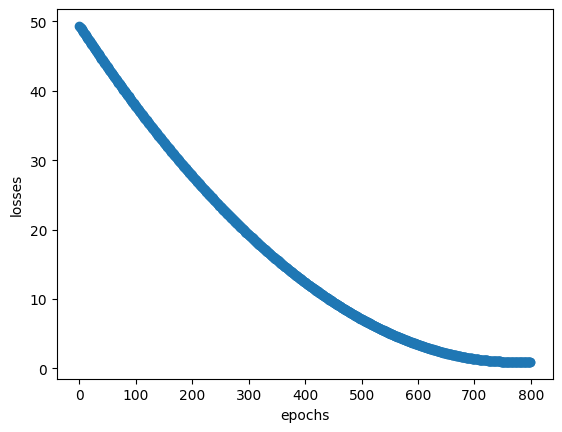

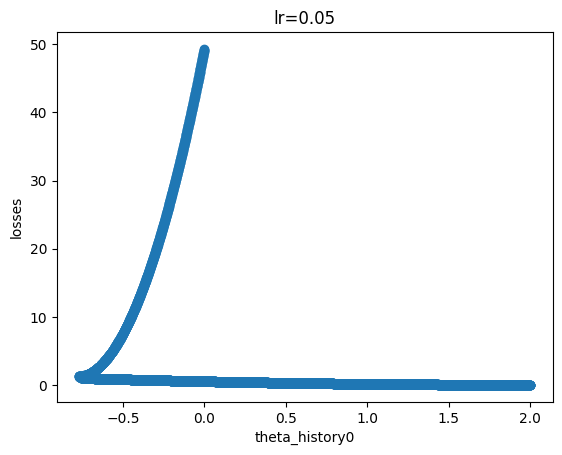

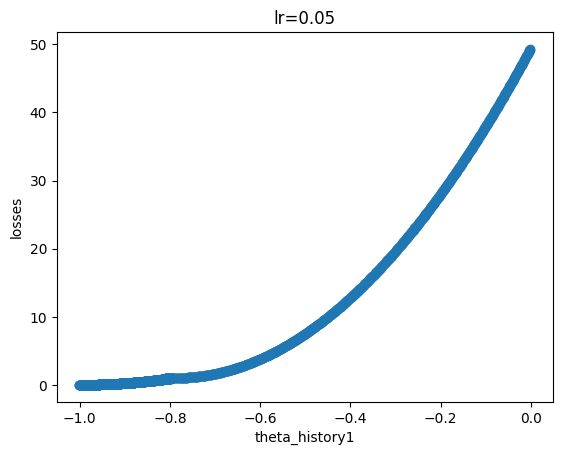

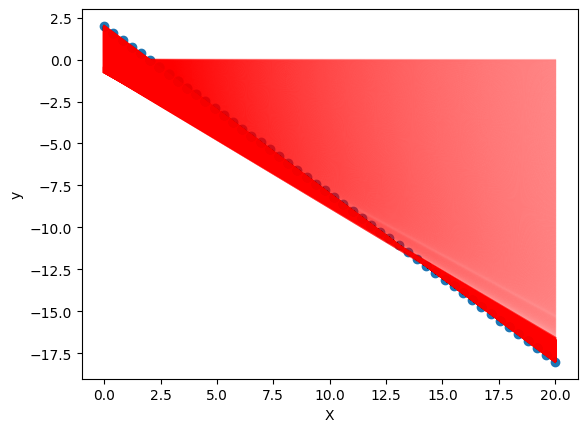

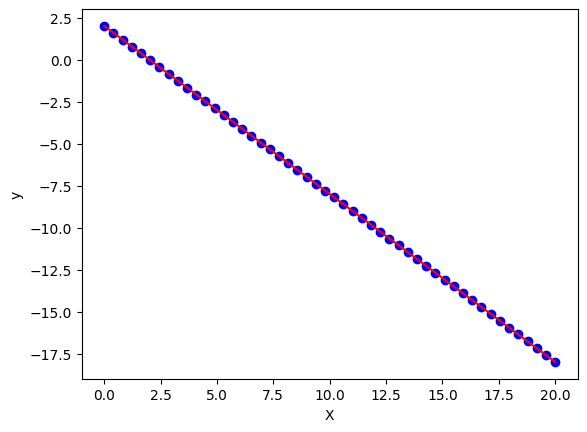

In [94]:
plots = plotting(total_cost, 800, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

##### The following results uses alpha = 0.001, beta1 = 0.5, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

In [95]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = Adam_GD(X, y, 0.001, 5000, 1e-08, 0.5, 0.99)

epoch 1
Cost:49.34693877551021
Theta0: -0.00099999999875 
Theta1: -0.0009999999999128115
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:49.224322744917934
Theta0: -0.0019997738929465854 
Theta1: -0.001999792578097343
Gradient:[[  7.989     ]
 [114.54918367]]
Gradient Norm: 114.82743400975143

epoch 3
Cost:49.10188794204568
Theta0: -0.0029991924507991813 
Theta1: -0.0029992592132718353
Gradient:[[  7.9780023]
 [114.40452  ]]
Gradient Norm: 114.68235573135547

epoch 4
Cost:48.97964884123425
Theta0: -0.003998152503221817 
Theta1: -0.003998305313118399
Gradient:[[  7.96700822]
 [114.25990377]]
Gradient Norm: 114.53732505252349

epoch 5
Cost:48.857616904603745
Theta0: -0.004996577871704381 
Theta1: -0.004996861060030853
Gradient:[[  7.95601879]
 [114.11534878]]
Gradient Norm: 114.39235578558582

epoch 6
Cost:48.73580049708012
Theta0: -0.0059944160441333435 
Theta1: -0.005994878356446541
Gradient:[[  7.94503481]
 [113.97086518]]
Gradient Norm: 114.2

In [96]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.9999888726991455

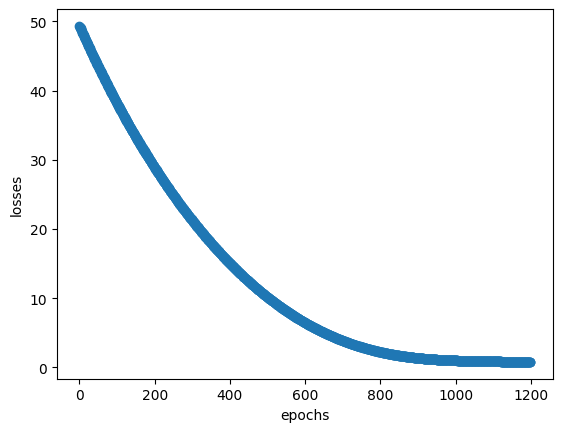

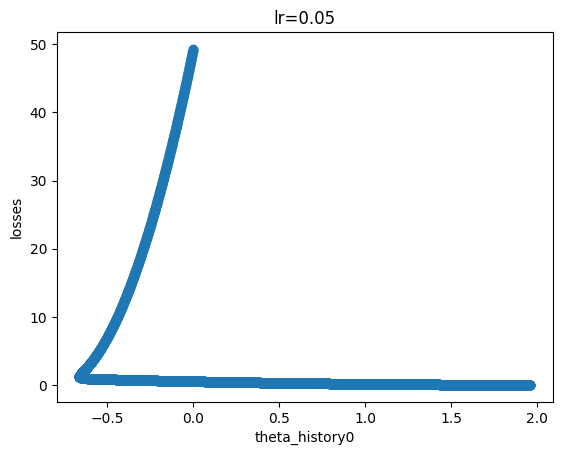

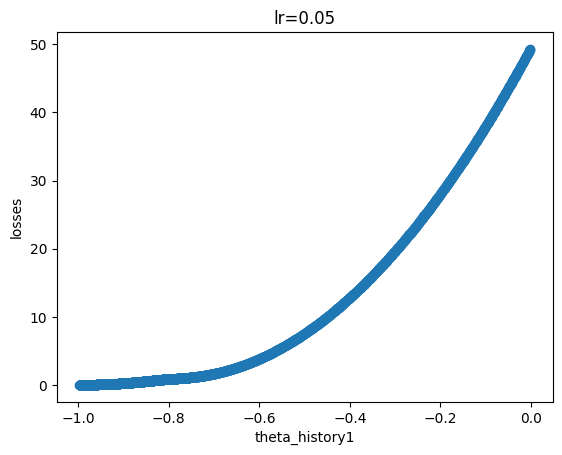

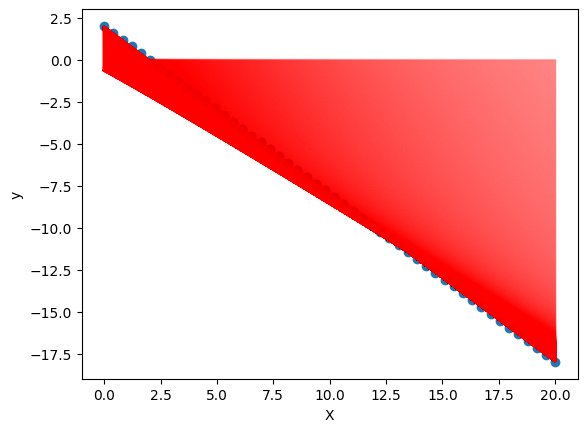

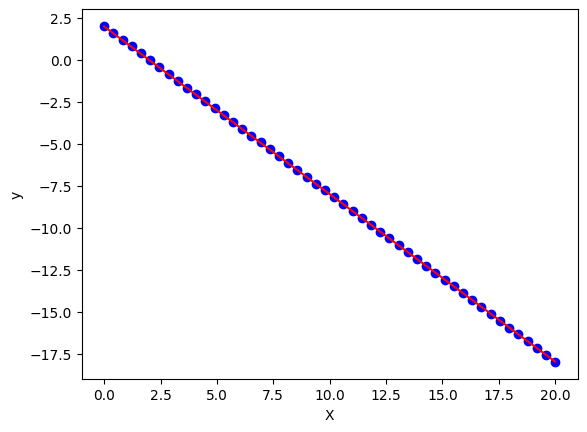

In [98]:
plots = plotting(total_cost, 1200, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

##### The following results uses alpha = 0.001, beta1 = 0.5, beta2 = 0.5, epsilon =  1e-08, and max. iterations = 5000.

In [101]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = Adam_GD(X, y, 0.001, 5000, 1e-08, 0.5, 0.5)

epoch 1
Cost:49.34693877551021
Theta0: -0.00099999999875 
Theta1: -0.0009999999999128115
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:49.224322744917934
Theta0: -0.001999999787043818 
Theta1: -0.0019999998226890563
Gradient:[[  7.989     ]
 [114.54918367]]
Gradient Norm: 114.82743400975143

epoch 3
Cost:49.101862430147406
Theta0: -0.0029999992822210926 
Theta1: -0.0029999993988284453
Gradient:[[  7.978     ]
 [114.40448982]]
Gradient Norm: 114.68232547105033

epoch 4
Cost:48.97955783971441
Theta0: -0.0039999984607947325 
Theta1: -0.003999998708666936
Gradient:[[  7.96700001]
 [114.25979601]]
Gradient Norm: 114.53721697578749

epoch 5
Cost:48.85740897593305
Theta0: -0.004999997346199953 
Theta1: -0.00499999777203293
Gradient:[[  7.95600001]
 [114.11510223]]
Gradient Norm: 114.39210852688207

epoch 6
Cost:48.735415836231255
Theta0: -0.005999995987834559 
Theta1: -0.005999996630583275
Gradient:[[  7.94500002]
 [113.97040849]]
Gradient Norm: 114

In [102]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.999989109076282

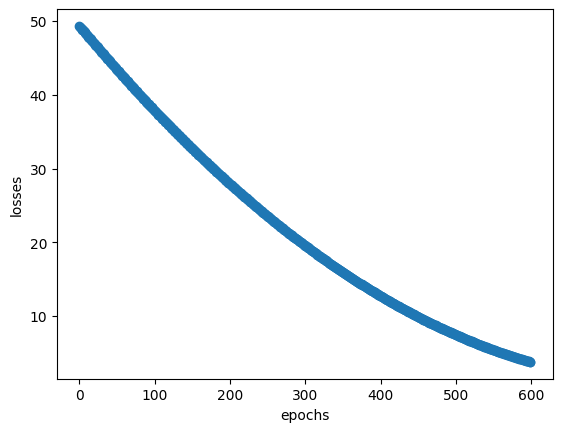

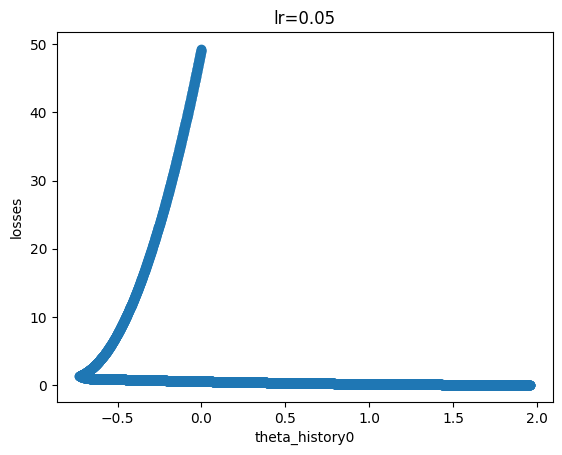

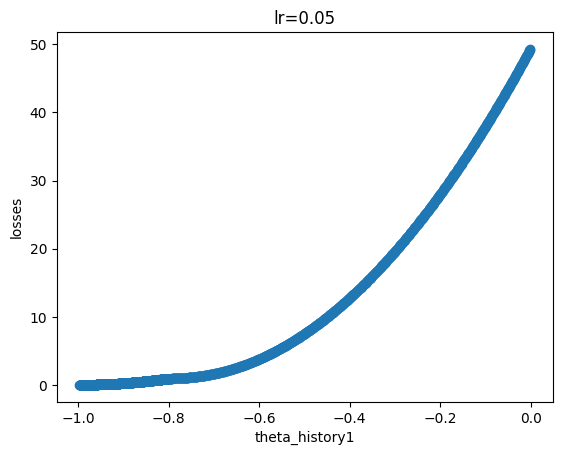

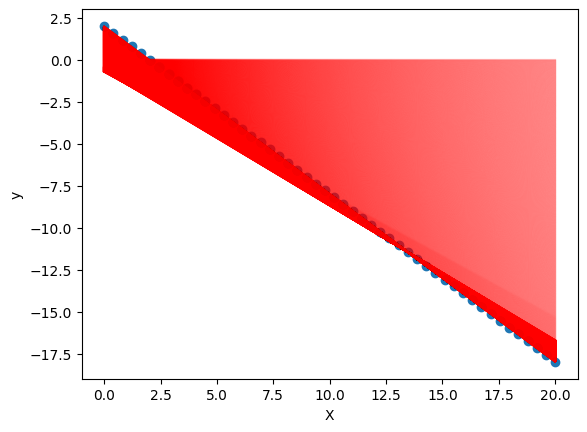

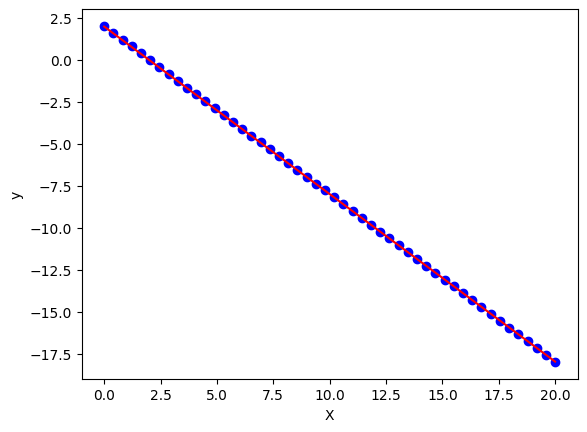

In [103]:
plots = plotting(total_cost, 600, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

##### The following results uses alpha = 0.01, beta1 = 0.9, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

In [104]:
theta, y_pred, total_cost, theta_history0, theta_history1, y_predictions = Adam_GD(X, y, 0.01, 5000, 1e-08, 0.9, 0.99)

epoch 1
Cost:49.34693877551021
Theta0: -0.0099999999875 
Theta1: -0.009999999999128114
Gradient:[[  8.        ]
 [114.69387755]]
Gradient Norm: 114.97254258164628

epoch 2
Cost:48.12778469407492
Theta0: -0.01999646472485337 
Theta1: -0.01999677648777555
Gradient:[[  7.89      ]
 [113.24693878]]
Gradient Norm: 113.52145718796693

epoch 3
Cost:46.924587893927345
Theta0: -0.029986977709170266 
Theta1: -0.02998813170936643
Gradient:[[  7.78003577]
 [111.80046954]]
Gradient Norm: 112.07084342494369

epoch 4
Cost:45.73759428816769
Theta0: -0.039969083984028514 
Theta1: -0.03997183737137071
Gradient:[[  7.67013171]
 [110.35479003]]
Gradient Norm: 110.62102243113326

epoch 5
Cost:44.56703964587272
Theta0: -0.04994029534642855 
Theta1: -0.04994563960714095
Gradient:[[  7.56031254]
 [108.91022494]]
Gradient Norm: 109.17231985639363

epoch 6
Cost:43.4131488012596
Theta0: -0.05989809564544364 
Theta1: -0.05990726400963044
Gradient:[[  7.45060331]
 [107.46710273]]
Gradient Norm: 107.72506513943057


In [105]:
r2 = r2_score(y, theta[0][0] + theta[1][0]*X)
r2

0.999991893950003

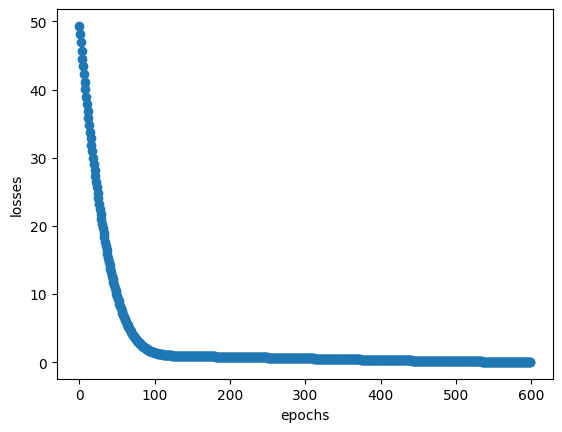

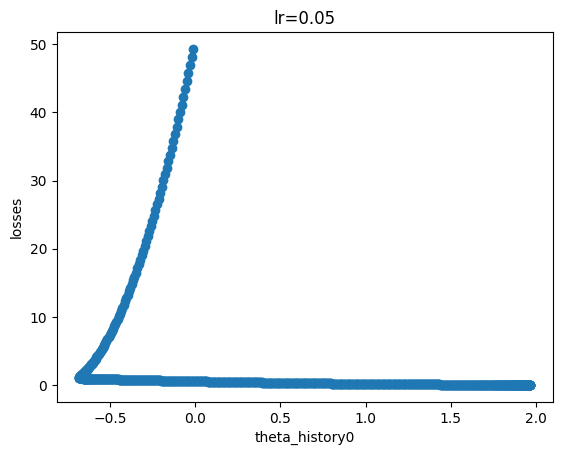

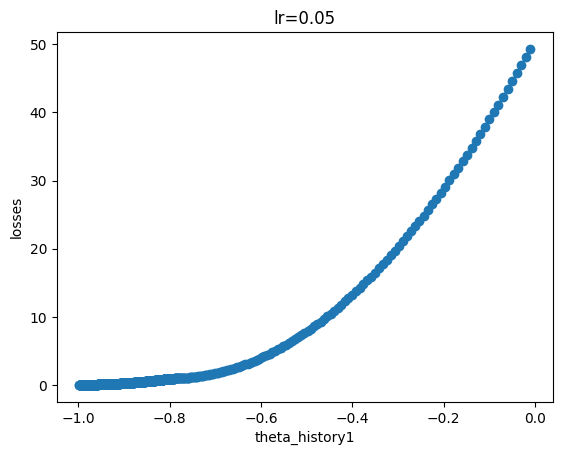

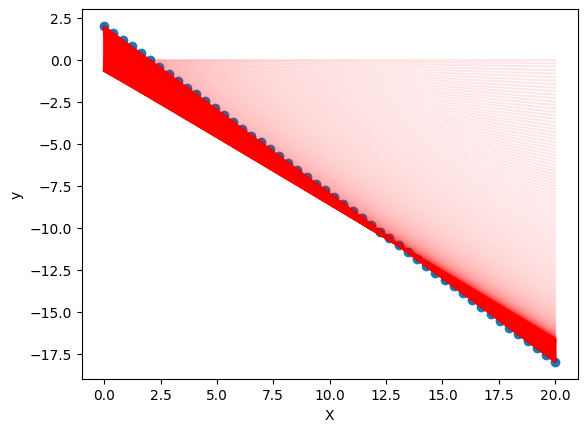

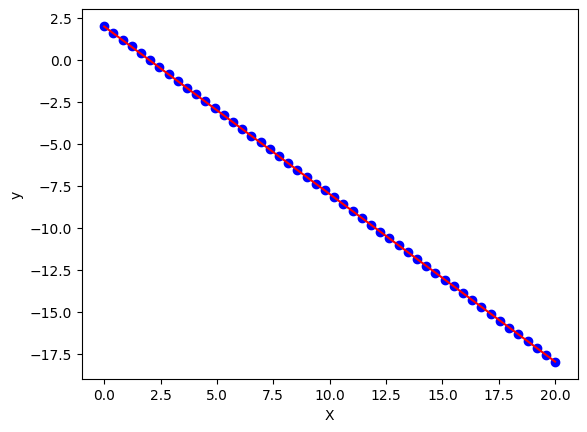

In [106]:
plots = plotting(total_cost, 600, theta_history0, theta_history1, X, y, y_predictions, theta)
plots.plot_all_plots()

## Congratulations 
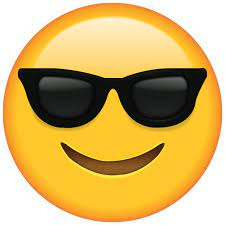